In [1]:
import os


import torch as th
import torch.nn.functional as F
import torch.nn as nn

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import torchvision.transforms as T

import albumentations as A

from tqdm import tqdm
import numpy as np
import pandas as pd
import cv2
import open_clip
from PIL import Image
import faiss

import matplotlib.pyplot as plt

import utilities

%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
# get product 10k

def read_img(img_path, is_gray=False):
    mode = cv2.IMREAD_COLOR if not is_gray else cv2.IMREAD_GRAYSCALE
    img = cv2.imread(img_path, mode)
    if not is_gray:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

class ProductDataset(Dataset):
    def __init__(self, 
                 img_dir, 
                 annotations_file, 
                 transform=None, 
                 final_transform=None, 
                 headers=None,
                 test_mode=False):
        self.data = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.final_transform = final_transform
        self.headers = {"img_path": "img_path", "product_id": "product_id"}
        if headers:
            self.headers = headers
        self.test_mode = test_mode
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.data[self.headers["img_path"]][idx])
        
        img = read_img(img_path)
        if self.test_mode:
            x, y, w, h = self.data["bbox_x"][idx], self.data["bbox_y"][idx], \
                         self.data["bbox_w"][idx], self.data["bbox_h"][idx]
            img = img[y:y+h, x:x+w]
            
        
        if self.transform is not None:
            img = transform(image=img)["image"]
        
        if self.final_transform is not None:
            if isinstance(img, np.ndarray):
                img =  Image.fromarray(img)
            img = self.final_transform(img)
            
        meta_data = {
            "product_id": self.data[self.headers["product_id"]][idx],
            "img_path":  self.data[self.headers["img_path"]][idx]
        }
        return img, meta_data
    
def get_final_transform():  
    final_transform = T.Compose([
            T.Resize(
                size=(224, 224), 
                interpolation=T.InterpolationMode.BICUBIC,
                antialias=True),
            T.ToTensor(), 
            T.Normalize(
                mean=(0.48145466, 0.4578275, 0.40821073), 
                std=(0.26862954, 0.26130258, 0.27577711)
            )
        ])
    return final_transform


# TAKEN FROM: https://github.com/IvanAer/G-Universal-CLIP 
class Multisample_Dropout(nn.Module):
    def __init__(self):
        super(Multisample_Dropout, self).__init__()
        self.dropout = nn.Dropout(.1)
        self.dropouts = nn.ModuleList([nn.Dropout((i+1)*.1) for i in range(5)])
        
    def forward(self, x, module):
        x = self.dropout(x)
        return th.mean(th.stack([module(dropout(x)) for dropout in self.dropouts],dim=0),dim=0) 

class Head(nn.Module):
    def __init__(self, hidden_size):
        super(Head, self).__init__()

        self.emb = nn.Linear(hidden_size, 512, bias=False)
        self.dropout = Multisample_Dropout()

    def forward(self, x):
        embeddings = self.dropout(x, self.emb)
        return F.normalize(embeddings)
    
class Model(nn.Module):
    def __init__(self, vit_backbone):
        super(Model, self).__init__()
        self.encoder = vit_backbone.visual
        self.head = Head(1024)

    def forward(self, x):
        x = self.encoder(x)
        return self.head(x)

In [3]:
vit_backbone, _, _ = open_clip.create_model_and_transforms(
    'ViT-H-14', pretrained=None
)

model = Model(vit_backbone)
model.load_state_dict(th.load('my_experiments/vit_h_224_products-10k/model_best_epoch_3_mAP3_0.53_slim.pt'))
model.half()
model.eval()
model.cuda()

Model(
  (encoder): VisionTransformer(
    (conv1): Conv2d(3, 1280, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0): ResidualAttentionBlock(
          (ln_1): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1280, out_features=1280, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1280, out_features=5120, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=5120, out_features=1280, bias=True)
          )
          (ls_2): Identity()
        )
        (1): ResidualAttentionBlock(
          (ln_1): LayerNorm((1280,), 

In [4]:
from sklearn.preprocessing import normalize

@th.no_grad()
def extract_embeddings(model, dataloader, epoch=10, use_cuda=True):
    features = []
    meta_data = []
    
    for _ in range(epoch):
        for imgs, meta in tqdm(dataloader):
            if use_cuda:
                imgs = imgs.cuda()
            features.append(th.squeeze(model(imgs.half())).detach().cpu().numpy().astype(np.float32))
            meta_data.append(meta)
    
    # to lazy to fix it so workaround
    img_path = []
    for m in meta_data:
        img_path.extend(m['img_path'])
        
    product_id = th.concat(tuple(m['product_id'] for m in meta_data)).detach().cpu().numpy()
    

    return np.concatenate(features, axis=0), img_path, product_id

In [5]:
final_transform = get_final_transform()
img_dir = "../development_test_data"

dataset_test = ProductDataset(img_dir, os.path.join(img_dir, "queries.csv"), None, final_transform, test_mode=True)
dataloader_test = DataLoader(dataset_test, batch_size=512, num_workers=4)

features_test, img_path_test, product_id_test = extract_embeddings(model, dataloader_test, 1)

dataset_train = ProductDataset(img_dir, os.path.join(img_dir, "gallery.csv"), None, final_transform)
dataloader_train = DataLoader(dataset_train, batch_size=512, num_workers=4)

features_train, img_path_train, product_id_train = extract_embeddings(model, dataloader_train, 1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.10s/it]


In [6]:
product_10k_features = np.concatenate([features_train, features_test], axis=0)
product_10k_features.shape

(3002, 512)

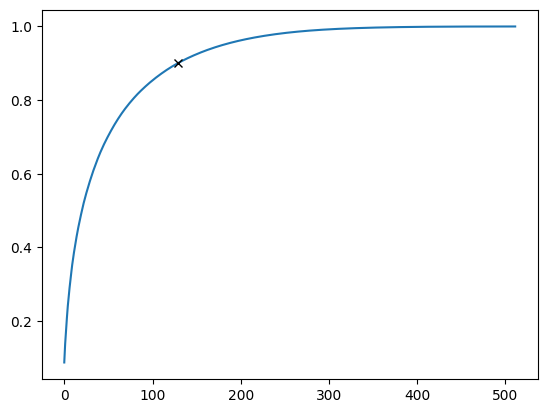

In [11]:
# do PCA
import sklearn.decomposition as D
import pickle

# transform data
pca = D.PCA().fit(product_10k_features)
var_sum = np.cumsum(pca.explained_variance_ratio_)
idx = np.where(var_sum > 0.90)[0][0]

pca_path = 'my_experiments/vit_h_224_products-10k/pca_epcoh_3.pkl'
pca_ = D.PCA(idx).fit(product_10k_features)
with open(pca_path, 'wb') as f:
    pickle.dump(pca_, f)

plt.plot(range(len(pca.explained_variance_ratio_)), np.cumsum(pca.explained_variance_ratio_), '-')
plt.plot(idx, var_sum[idx], 'xk')

In [12]:
features_test = pca_.transform(features_test)
features_train = pca_.transform(features_train)

In [13]:
u_p_id_test, test_c = np.unique(product_id_test, return_counts=True)
u_p_id_train, train_c = np.unique(product_id_train, return_counts=True)
for i in range(len(u_p_id_test)):
    if len(np.where(u_p_id_train == u_p_id_test[i])[0]) == 0:
        print('not exists', u_p_id_test[i], test_c[i])
    else:
        print('exists train count ', u_p_id_train[i], train_c[i], 'test count', u_p_id_test[i], test_c[i])
        

exists train count  0 3 test count 0 3
exists train count  1 4 test count 1 3
exists train count  2 1 test count 2 3
exists train count  3 2 test count 3 2
exists train count  4 2 test count 4 2
exists train count  5 1 test count 5 2
exists train count  6 1 test count 6 1
exists train count  7 1 test count 7 5
exists train count  8 2 test count 8 3
exists train count  9 3 test count 9 5
exists train count  10 1 test count 10 3
exists train count  11 3 test count 11 4
exists train count  12 1 test count 12 5
exists train count  13 1 test count 13 2
exists train count  14 1 test count 14 4
exists train count  15 1 test count 15 4
exists train count  16 1 test count 16 1
exists train count  17 1 test count 17 4
exists train count  18 2 test count 18 5
exists train count  19 1 test count 19 2
exists train count  20 2 test count 20 2
exists train count  21 1 test count 21 3
exists train count  22 1 test count 22 2
exists train count  23 1 test count 23 3
exists train count  24 1 test count 

In [15]:
dist, ind = utilities.get_similiarity_l2(features_train, features_test, 10000)

Processing indices...
Finished processing indices, took 0.2509613037109375s


In [16]:
def calculate_map_scores(product_id_test, product_id_train, ind):
    map_score_per_image = []

    for i, product_id in enumerate(tqdm(product_id_test)): 
        loc_ = np.where(product_id_train[ind[i]] == product_id_test[i])[0] + 1
        map_score_per_image.append(np.sum(np.arange(1, len(loc_[:3]) + 1) / loc_[:3]) / 3)

    map_score_per_image = np.array(map_score_per_image)
    print(f"Mean AP@3 is {np.mean(map_score_per_image)}")
    worst_to_best = np.argsort(map_score_per_image)
    return worst_to_best, map_score_per_image


In [17]:
worst_to_best, map_score_per_image = calculate_map_scores(product_id_test, product_id_train, ind)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1935/1935 [00:00<00:00, 49375.07it/s]

Mean AP@3 is 0.3191412897218824


In [18]:
def plot_img(img_dir, 
             img_path_q, 
             img_path_g, 
             product_id_q, 
             product_id_g, 
             distances,
             map_score
            ):
    imgs = [read_img(os.path.join(img_dir, img_path_q))]
    imgs.extend([read_img(os.path.join(img_dir, img_path)) for img_path in img_path_g])
    
    fig = plt.figure(figsize=(26, 4))
    for i in range(len(imgs)):
        img = imgs[i]
        fig.add_subplot(1, len(imgs) + 1, i+1)
        if i == 0:
            title = f'Product ({product_id_q})\nP@3({map_score:.2f})'
        else:
            title = f'''Product ({product_id_g[i-1]})\nDist({distances[i-1]:.2f})'''
        plt.title(title, fontsize=10)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

810 predictions [5266 5266 5266 4985 5266 5056 5056 5174 4985   10 5126 5215 5177 5044
 4999] truth 5257


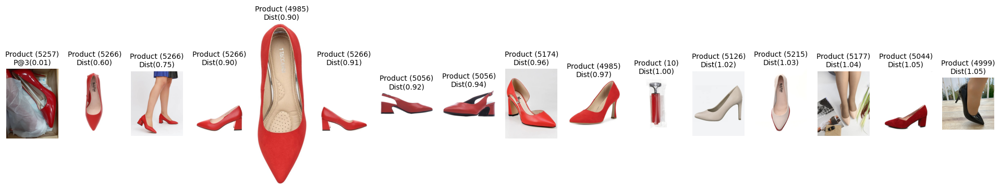

850 predictions [3652 3543 3652 3516 3480 3543 3585 3610 3501 3516 3534 3609 3603 3543
 3610] truth 3546


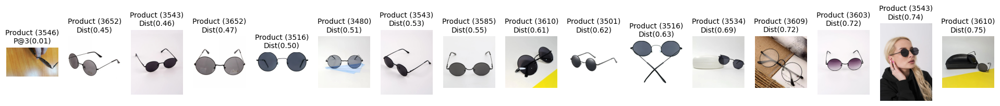

1381 predictions [3610 3516 3603 3483 3480 3516 3487 3652 3656 3652 3587 3657 3585 3656
 3501] truth 3542


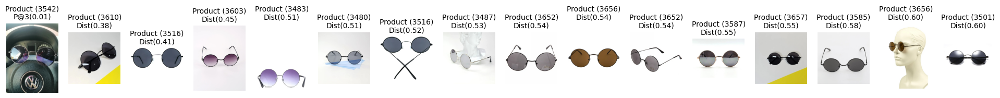

1197 predictions [5110 5295 5295 5303 5020 5303 5020 4971 5205 5303 5154 5154 5154 4965
 5292] truth 5264


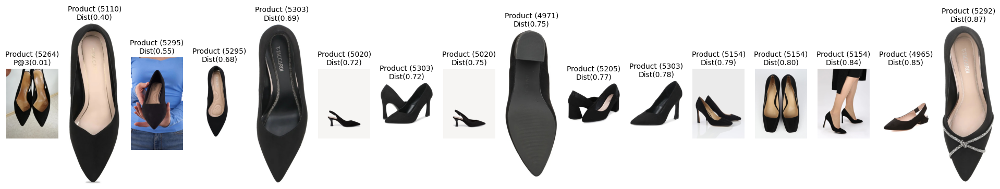

455 predictions [ 4 21  3  3 45 67 40 35 35 36 73 70 11 66  4] truth 52


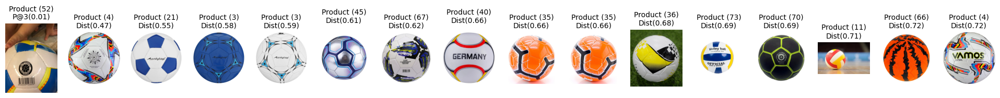

1260 predictions [3538 3655 3532 3538 3702 3616 3581 3538 3532 3488 3616 3532 3468 3484
 3526] truth 3472


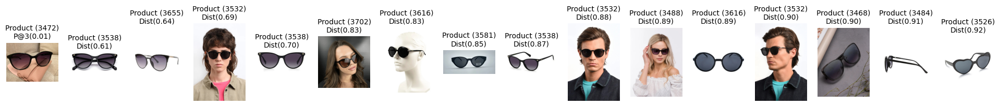

932 predictions [20 72  3 72 45 45 70 14 21  3 45 20 77 35 35] truth 66


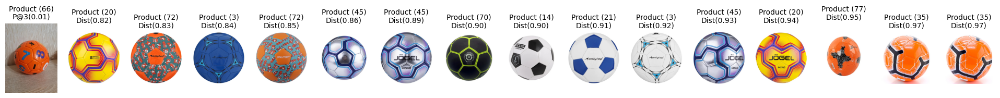

1923 predictions [5316 5316 5308 5308 5316 5137 5137 5137 5336 5237 4978 5197 5237 5166
 5246] truth 5042


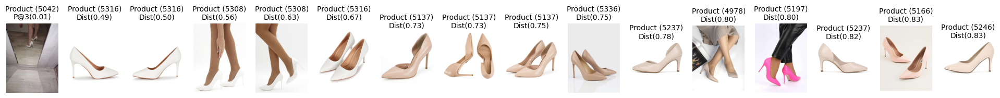

1127 predictions [4978 5301 4978 5283 5215 5141 4994 5351 4978 5316 5118 5301 5351 5118
 5320] truth 4955


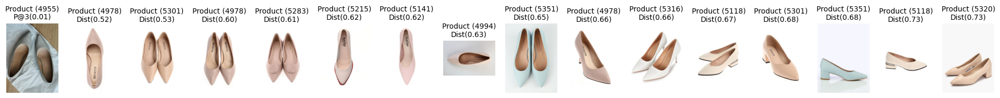

1446 predictions [3682 3637 3631 3673 3542 3616 3637 3631 3522 3488 3488 3648 3640 3637
 3468] truth 3654


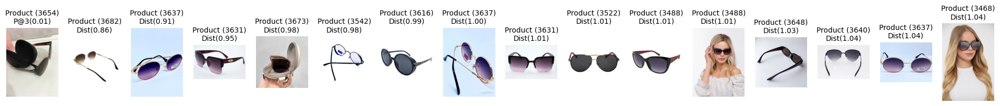

In [19]:
for i in worst_to_best[100:110]:
    idx_ = ind[i][:15]
    
    print(i, 'predictions', product_id_train[idx_], 'truth', product_id_test[i])
    img_path_q = img_path_test[i]
    img_path_g = [img_path_train[j] for j in idx_]
    plot_img(img_dir, 
             img_path_q, 
             img_path_g, 
             product_id_test[i], 
             product_id_train[idx_], 
             dist[i],
             map_score_per_image[i])

68 predictions [4949 4949 4949 5134 5325 5192 5217 5092 5231 4981 5201 5254 5134 5034
 5157] truth 4949


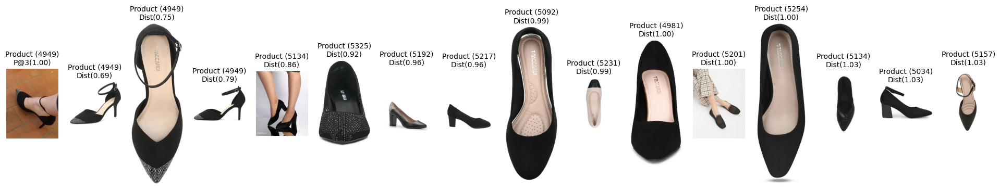

1362 predictions [5151 5151 5151 5129 5129 5165 5316 5165 5316 5351 5316 5047 5322 5009
 5316] truth 5151


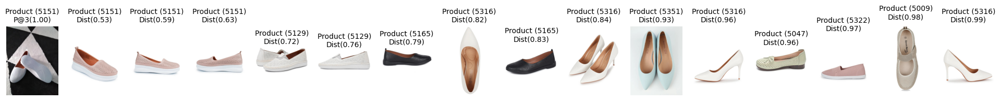

12 predictions [5143 5143 5143 5218 5036 5223 5282 5036 5136 5223 5158 5268 5081 5321
 5136] truth 5143


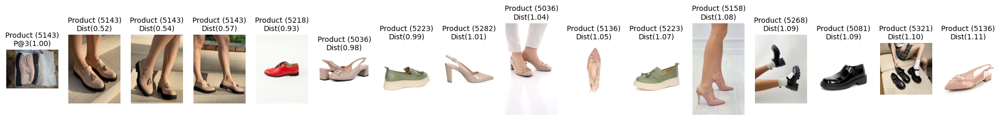

115 predictions [5250 5250 5250 5294 5242 5242 5254 5154 5044 5205 5303 5303 5294 5255
 5030] truth 5250


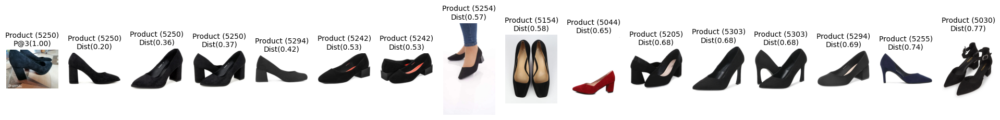

10 predictions [5008 5008 5008 5008 5008 5223 5178 5073 5268 5223 4989 5073 5178 5196
 5178] truth 5008


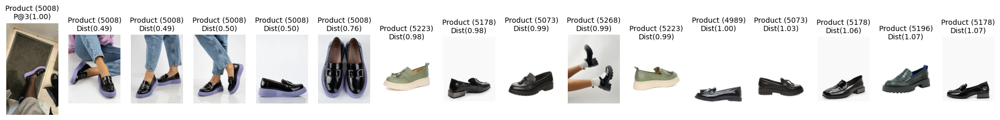

291 predictions [5210 5210 5210 5177 5213 5227 5227 5118 5320 5215 5141 5163 4978 5213
 5099] truth 5210


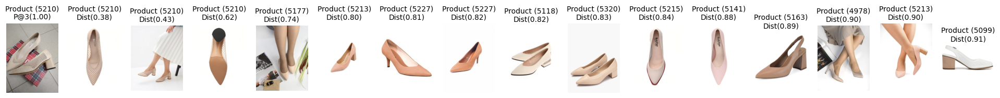

208 predictions [5302 5302 5302 5177 5094 5203 5094 5141 5191 5046 5301 4951 5039 5043
 5132] truth 5302


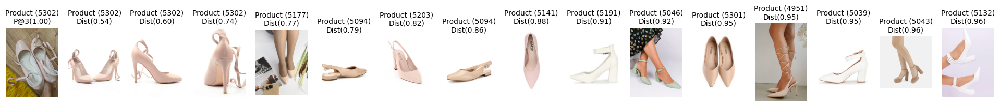

141 predictions [5024 5024 5024 5024 5223 5046 5046 5302 5223 5302 5351 4951 5302 5033
 5087] truth 5024


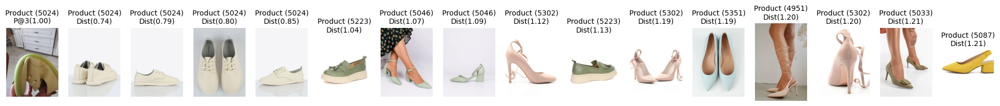

216 predictions [5014 5014 5014 4960 4975 5314 5187 5324 5043 5343 4949 4949 5022 5034
 5191] truth 5014


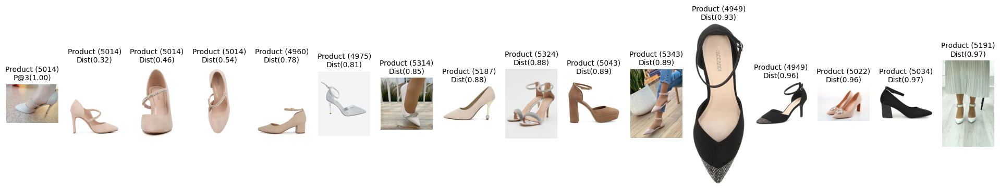

223 predictions [49 49 49 25 46 27 44 50 36  5 41 33 34 47 13] truth 49


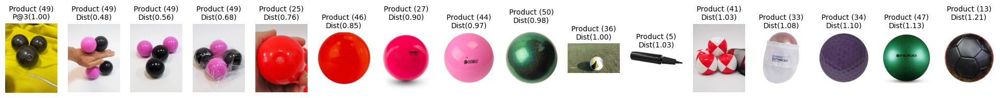

In [20]:
for i in worst_to_best[-100:-90]:
    idx_ = ind[i][:15]
    
    print(i, 'predictions', product_id_train[idx_], 'truth', product_id_test[i])
    img_path_q = img_path_test[i]
    img_path_g = [img_path_train[j] for j in idx_]
    plot_img(img_dir, 
             img_path_q, 
             img_path_g, 
             product_id_test[i], 
             product_id_train[idx_], 
             dist[i],
             map_score_per_image[i])

## Shopee

In [45]:
img_dir = "../shopee/train_images"

In [7]:
final_transform = get_final_transform()

dataset_shopee = ProductDataset(img_dir, 
                              '../shopee/train.csv', 
                              None, 
                              final_transform, 
                              headers = {"img_path": "image", "product_id": "label_group"})
dataloader_shopee = DataLoader(dataset_shopee, batch_size=512, num_workers=4)

features_shopee, img_path_shopee, product_id_shopee = extract_embeddings(model, dataloader_shopee, 1)



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 67/67 [03:56<00:00,  3.53s/it]


In [39]:
unique = np.unique(product_id_shopee)
for i in tqdm(range(len(product_id_shopee))):
    product_id_shopee[i] = np.where(unique == product_id_shopee[i])[0][0]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 34250/34250 [00:00<00:00, 193456.13it/s]


In [42]:
dist_shopee, ind_shopee = utilities.get_similiarity_l2(features_shopee, features_shopee, 16)
worst_to_best_shopee, map_score_per_image_shopee = calculate_map_scores(
    product_id_shopee, 
    product_id_shopee, 
    ind_shopee
)

Processing indices...
Finished processing indices, took 22.95370388031006s


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 34250/34250 [00:00<00:00, 143120.64it/s]

Mean AP@3 is 0.7908421062986757


22086 predictions [ 9744 10615 10615  6845  9744 10255 10255  3342  1659  3265  3265  6356
  3342  6356  1036] truth 10615


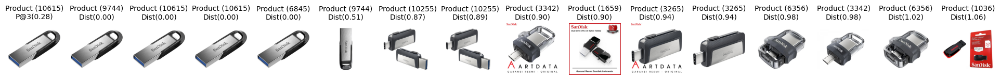

21788 predictions [1905 8637 8637  292 8637  292  292 4144  292 8877  292  292 1905 1905
 4144] truth 1905


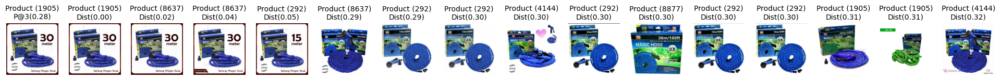

8262 predictions [ 4438 11010 11010 11010 11010 11010 11010 11010 11010 11010 11010  4438
  4438  4438  4438] truth 4438


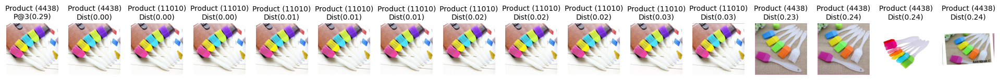

17756 predictions [ 5477  7491  5477  5477  5477  5477  7491  5477  7491  5477   355   355
 10352 10352 10352] truth 7491


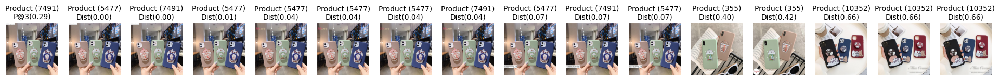

29631 predictions [ 9538 10077  8080  8080  8080  8080  8080  8080  8080  8080  9538  9538
 10077  6809  6809] truth 9538


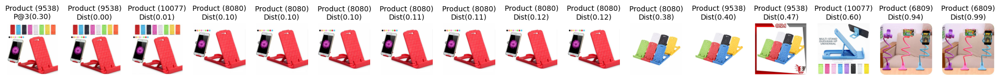

31528 predictions [7713 5235 5235 5235 5235 5235 5235 5235 7713 5235 5235 5235 5235 7713
 7713] truth 7713


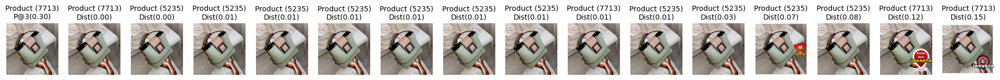

16110 predictions [ 2696 10753  4024  5223  5223  5223 10753 10753  5557  5223 10753   127
  4328   493  8802] truth 1013


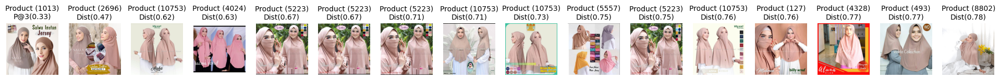

16116 predictions [10451  1274  1274  1274  8717 10451  6838 10451 10451  4950  4950  4950
  2413   773   773] truth 1212


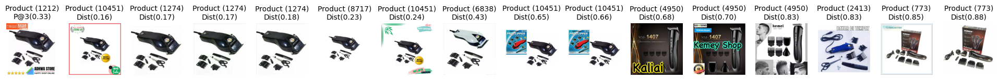

27683 predictions [2118 5001 5001 2118 6072 2118 4698 5001 4698 8069 2118 9548 8069 2118
 4322] truth 3302


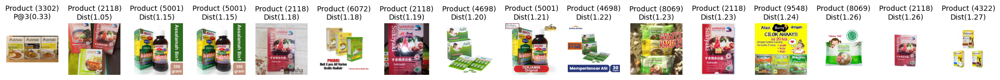

3816 predictions [ 9718 10753  7546  6769  3798  4422  4147 10616 10753  3001  2432  1286
 10753  5223  5129] truth 4487


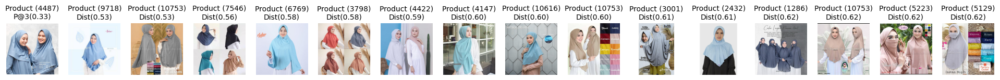

In [52]:
for i in worst_to_best_shopee[10:20]:
    idx_ = ind_shopee[i][1:]
    
    print(i, 'predictions', product_id_shopee[idx_], 'truth', product_id_shopee[i])
    img_path_q = img_path_shopee[i]
    img_path_g = [img_path_shopee[j] for j in idx_]
    plot_img(img_dir, 
             img_path_q, 
             img_path_g, 
             product_id_shopee[i], 
             product_id_shopee[idx_], 
             dist_shopee[i][1:],
             map_score_per_image_shopee[i])

20919 predictions [ 843  843 4609 1249 1249 4609 8699 1249 8699 2907 3960 8464 8464 2907
 6729] truth 843


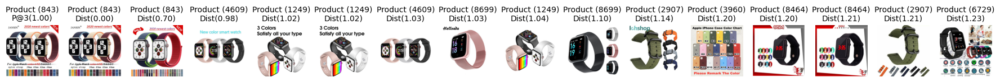

20918 predictions [7072 7072 7072 7765 7765 7765 3725 9964 8272 9578  398 8186 8186 9101
  398] truth 7072


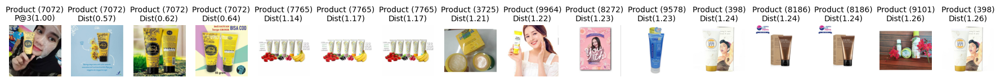

20917 predictions [  564   564   564   564   564   410   410  5274  5338 10268  7383  4140
  4140  4140  4140] truth 564


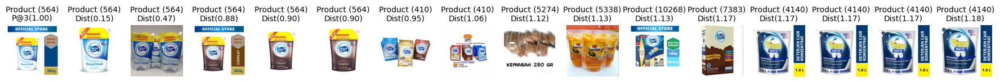

20880 predictions [ 4515  4515  4515  4515  4515  4515  4515  4508  4515  4508  3732  3732
 10898 10898  8387] truth 4515


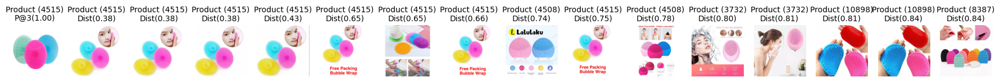

20916 predictions [5293 5293 5293 5293 8884 3154 1401 5293 5293 3154 5293 1465 8884  289
  771] truth 5293


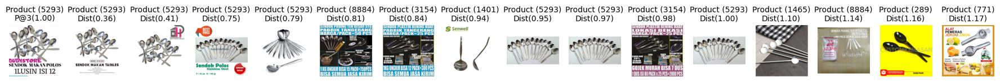

20912 predictions [1725 1725 6313 6313 7514 7514  978  978  978  978  978  978  978 6605
  978] truth 1725


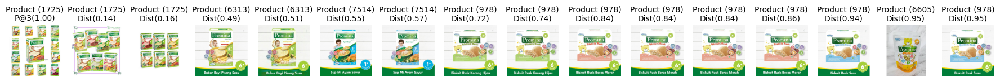

20911 predictions [ 7063  7063  7063 10314 10314 10314  5656  7063  7963  8783  5581  8783
  4193 10263  5656] truth 7063


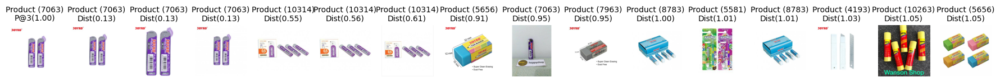

7689 predictions [3326 3326 3326 3326 3326 3326 3326 3326 3326 7972 4425 3326 4425 4425
 4425] truth 3326


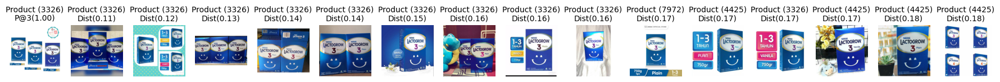

7690 predictions [10137 10137  9671  9671  1344  1344  6869  6869  8659  8930 10605  2148
  2241  2148  3894] truth 10137


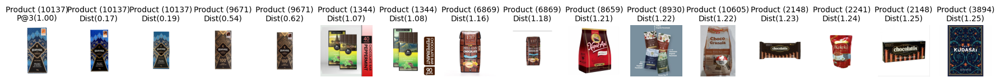

7691 predictions [ 5099  5099  5099  5099  5099  5099  5099  5099 10512 10512  5310  9180
  5310   730   730] truth 5099


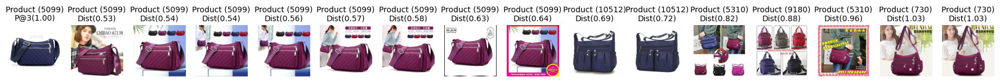

In [49]:
for i in worst_to_best_shopee[-120:-110]:
    idx_ = ind_shopee[i][1:]
    
    print(i, 'predictions', product_id_shopee[idx_], 'truth', product_id_shopee[i])
    img_path_q = img_path_shopee[i]
    img_path_g = [img_path_shopee[j] for j in idx_]
    plot_img(img_dir, 
             img_path_q, 
             img_path_g, 
             product_id_shopee[i], 
             product_id_shopee[idx_], 
             dist_shopee[i][1:],
             map_score_per_image_shopee[i])

In [44]:
%%timeit -n 5

emb1 = np.random.random((9000, 512)).astype(np.float32)
emb2 = np.random.random((1100, 512)).astype(np.float32)
index = faiss.IndexFlatL2(512)
index.add(emb1)
_, ind = index.search(emb2, 1000)

313 ms ± 1.7 ms per loop (mean ± std. dev. of 7 runs, 5 loops each)


In [ ]:
310 ms ± 308 µs per loop (mean ± std. dev. of 7 runs, 5 loops each)
